In [1]:
import os
import shutil
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from lightgbm.sklearn import LGBMClassifier

from sklearn.model_selection import StratifiedKFold, cross_val_predict
from sklearn.metrics import classification_report, roc_auc_score, roc_curve, auc
import matplotlib.pyplot as plt

In [2]:
consump_df = pd.read_csv('../data/CS/Hubballi_Dhaward_Water_Consumption_Nightlight_Population.csv')

feature_df = pd.read_csv('../outputs/segmentation_result_cleaned.csv')
print("Number of HHs with availabel SVI:", feature_df.shape[0])

building_df = pd.read_csv('../data/CS/Hubballi_CS_building.csv') 

# Drop rows with missing building height
building_df = building_df.dropna(subset=['building_height'])

cs_building_df = pd.merge(consump_df, building_df, on='sl_no', how='left')
print("Number of HHs with in Customer Survey:", cs_building_df.shape[0])

df = pd.merge(feature_df, cs_building_df, on='sl_no', how='left')
print("Number of HHs with both CS and SVI:", df.shape[0])

Number of HHs with availabel SVI: 28114
Number of HHs with in Customer Survey: 35980
Number of HHs with both CS and SVI: 28114


In [3]:
# Rename 'monthly_family_income' to 'Target'
df = df.rename(columns={'monthly_family_income': 'Target'})

# Drop rows with missing values in the 'Target' column
df = df.dropna(subset=['Target'])

# Reset the index after dropping rows
df = df.reset_index(drop=True)

print(f"Shape of DataFrame after dropping rows with missing Target: {df.shape[0]}")

Shape of DataFrame after dropping rows with missing Target: 27128


In [4]:
# Split the data into training and testing sets
train_df, test_df = train_test_split(df, test_size=0.2, random_state=123, shuffle=True, stratify=df['Target'])
train_df.shape

(21702, 95)

In [5]:
train_df['Target'].value_counts()

Target
10-20K    11879
0-10K      5226
20-50K     4131
> 50K       466
Name: count, dtype: int64

## Training Models
### Image Segmentation Features + ML

In [6]:
from sklearn.base import clone, BaseEstimator, ClassifierMixin
from sklearn.utils.validation import check_X_y, check_is_fitted, check_array
from sklearn.utils.multiclass import check_classification_targets

class OrdinalClassifier(BaseEstimator, ClassifierMixin):
    #https://towardsdatascience.com/simple-trick-to-train-an-ordinal-regression-with-any-classifier-6911183d2a3c
    """
    A classifier that can be trained on a range of classes.
    @param classifier: A scikit-learn classifier.
    """
    def __init__(self, clf):
        self.clf = clf
        self.clfs = {}
        self.classes_ = None  # Add this to store the classes

    def fit(self, X, y, **kwargs):
        # Store the classes
        self.classes_ = np.sort(np.unique(y))
        self.uniques_class = self.classes_

        if self.uniques_class.shape[0] > 2:
            for i in range(self.uniques_class.shape[0] - 1):
                binary_y = (y > self.uniques_class[i]).astype(np.uint8)
                clf = clone(self.clf)
                clf.fit(X, binary_y, **kwargs)
                self.clfs[i] = clf

    def predict(self, X):
        return np.argmax(self.predict_proba(X), axis=1)

    def predict_proba(self, X):
        h = [self.clfs[k].predict_proba(X)[:, 1].reshape(-1, 1) for k in self.clfs]

        p_x_first = 1 - h[0]
        p_x_last = h[-1]
        p_x_middle = [h[i] - h[i + 1] for i in range(len(h) - 1)]

        probs = np.hstack([p_x_first, *p_x_middle, p_x_last])
        return probs


In [7]:
def cross_val_evaluate_model(model, features, labels, cv, class_labels):

    # Create a StratifiedKFold object
    stratified_kfold = StratifiedKFold(n_splits=cv, shuffle=True, random_state=123)

    # Cross-validation predictions with stratification
    preds = cross_val_predict(model, features, labels, cv=stratified_kfold, method='predict')
    probs = cross_val_predict(model, features, labels, cv=stratified_kfold, method='predict_proba')

    # Classification report
    print(classification_report(labels, preds, target_names=class_labels))

    # Calculate ROC-AUC score
    y_true = pd.get_dummies(labels).values
    y_pred = pd.DataFrame(probs, columns=class_labels).values
    roc_auc = roc_auc_score(y_true, y_pred, multi_class='ovr')
    print(f"ROC-AUC Score: {roc_auc}")

    # ROC Curve for each class
    fpr = {}
    tpr = {}
    roc_auc_dict = {}

    for i, label in enumerate(class_labels):
        fpr[label], tpr[label], _ = roc_curve(y_true[:, i], y_pred[:, i])
        roc_auc_dict[label] = auc(fpr[label], tpr[label])

    plt.figure()
    for label in class_labels:
        plt.plot(fpr[label], tpr[label], label=f'{label} (AUC = {roc_auc_dict[label]:.2f})')
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve for Each Class')
    plt.legend(loc="lower right")
    plt.show()

# Labels for classification
labels = ['0-10k', '10-20k', '20-50k', '>50k']


Original training set size: (21702, 54), (21702,)
Balanced training set size: (47516, 54), (47516,)
Ordinal Logistic Regression Model with Over-Sampling
                  precision    recall  f1-score   support

 Class 0-10K (0)       0.42      0.50      0.46     11879
Class 10-20K (1)       0.31      0.16      0.21     11879
Class 20-50K (2)       0.32      0.22      0.26     11879
 Class > 50K (3)       0.40      0.64      0.49     11879

        accuracy                           0.38     47516
       macro avg       0.36      0.38      0.36     47516
    weighted avg       0.36      0.38      0.36     47516

ROC-AUC Score: 0.6429303466443281


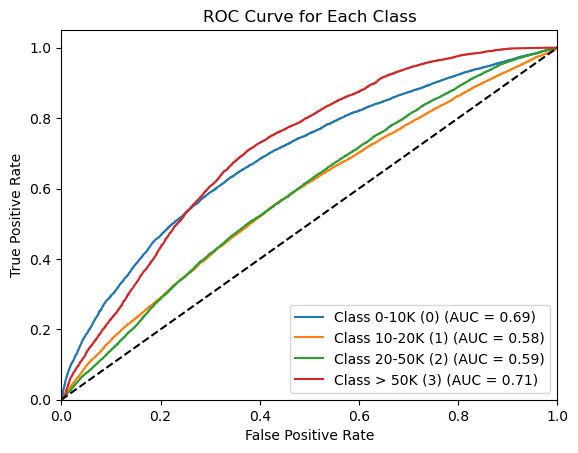

Ordinal Random Forest Model with Over-Sampling
                  precision    recall  f1-score   support

 Class 0-10K (0)       0.62      0.46      0.53     11879
Class 10-20K (1)       0.49      0.53      0.51     11879
Class 20-50K (2)       0.55      0.46      0.50     11879
 Class > 50K (3)       0.68      0.91      0.78     11879

        accuracy                           0.59     47516
       macro avg       0.59      0.59      0.58     47516
    weighted avg       0.59      0.59      0.58     47516

ROC-AUC Score: 0.8235787553635542


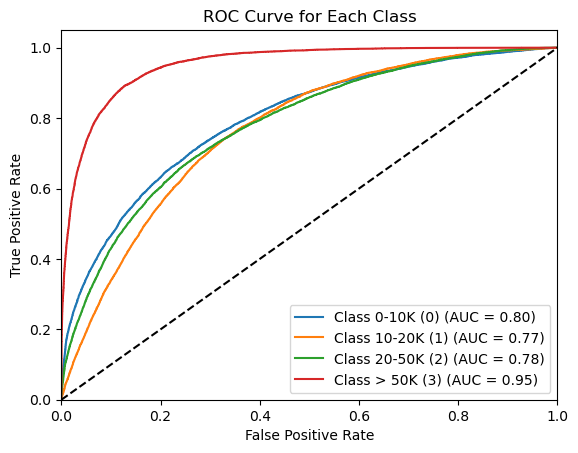

Ordinal Gradient Boosting Model with Over-Sampling
                  precision    recall  f1-score   support

 Class 0-10K (0)       0.55      0.41      0.47     11879
Class 10-20K (1)       0.46      0.51      0.49     11879
Class 20-50K (2)       0.43      0.39      0.41     11879
 Class > 50K (3)       0.61      0.75      0.68     11879

        accuracy                           0.52     47516
       macro avg       0.51      0.52      0.51     47516
    weighted avg       0.51      0.52      0.51     47516

ROC-AUC Score: 0.769470681106655


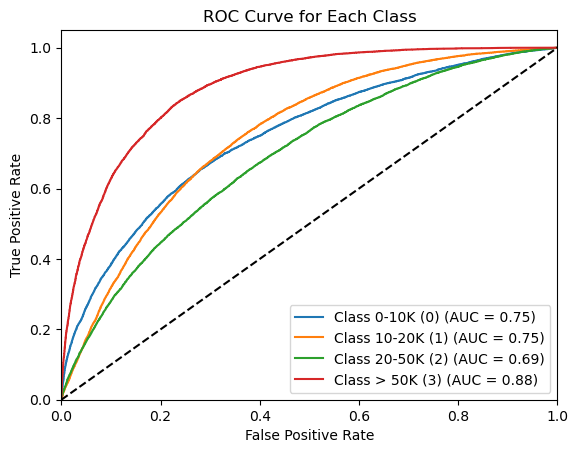

Ordinal LightGBM Model with Over-Sampling
                  precision    recall  f1-score   support

 Class 0-10K (0)       0.63      0.48      0.54     11879
Class 10-20K (1)       0.50      0.55      0.52     11879
Class 20-50K (2)       0.55      0.55      0.55     11879
 Class > 50K (3)       0.80      0.91      0.85     11879

        accuracy                           0.62     47516
       macro avg       0.62      0.62      0.62     47516
    weighted avg       0.62      0.62      0.62     47516

ROC-AUC Score: 0.8451343613295139


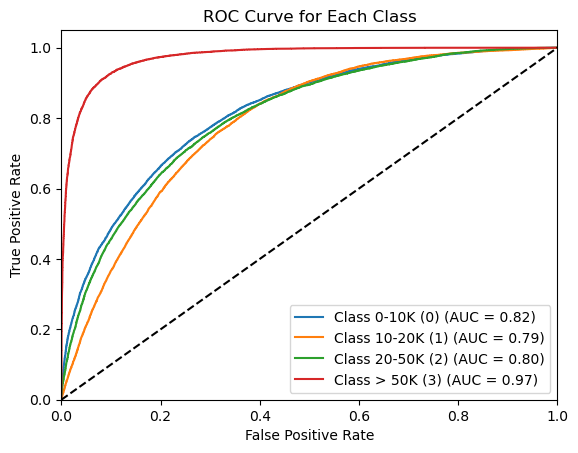

In [8]:
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.utils.class_weight import compute_class_weight
from imblearn.over_sampling import SMOTE

# Filter out 'sl_no' and 'name' columns
segmentation_columns = [col for col in feature_df.columns if col not in ['sl_no', 'name']]

# Filter the DataFrame to include segmentation columns
filtered_df = train_df[segmentation_columns]

# Ensure all data in `filtered_df` is numeric (just in case)
filtered_df = filtered_df.apply(pd.to_numeric, errors='coerce')

# Standardize the segmentation columns
scaler = StandardScaler()
segmentation_scaled = scaler.fit_transform(filtered_df)

# Prepare ordinal labels
label_mapping = {'0-10K': 0, '10-20K': 1, '20-50K': 2, '> 50K': 3}

# Map the target labels to ordinal values
train_labels = train_df['Target'].map(label_mapping).values

# Convert the class labels to strings
class_labels = [f'Class {key} ({value})' for key, value in label_mapping.items()]

# Apply SMOTE to balance the training dataset
smote = SMOTE(random_state=123)
X_train_balanced, y_train_balanced = smote.fit_resample(segmentation_scaled, train_labels)

print(f"Original training set size: {segmentation_scaled.shape}, {train_labels.shape}")
print(f"Balanced training set size: {X_train_balanced.shape}, {y_train_balanced.shape}")

# Train and evaluate the ordinal logistic regression model
print("Ordinal Logistic Regression Model with Over-Sampling")
ordinal_logistic_model = OrdinalClassifier(clf=LogisticRegression(max_iter=1000, multi_class='ovr', solver='lbfgs'))
cross_val_evaluate_model(ordinal_logistic_model, X_train_balanced, y_train_balanced, cv=5, class_labels=class_labels)

# Train and evaluate the ordinal random forest model
print("Ordinal Random Forest Model with Over-Sampling")
ordinal_rf_model = OrdinalClassifier(clf=RandomForestClassifier(n_estimators=100, max_depth=10, random_state=123))
cross_val_evaluate_model(ordinal_rf_model, X_train_balanced, y_train_balanced, cv=5, class_labels=class_labels)

# Train and evaluate the ordinal gradient boost model
print("Ordinal Gradient Boosting Model with Over-Sampling")
ordinal_gb_model = OrdinalClassifier(clf=GradientBoostingClassifier(n_estimators=100, learning_rate=0.1, random_state=123))
cross_val_evaluate_model(ordinal_gb_model, X_train_balanced, y_train_balanced, cv=5, class_labels=class_labels)

# Train and evaluate the ordinal LightGBM model
print("Ordinal LightGBM Model with Over-Sampling")
ordinal_lgb_model = OrdinalClassifier(clf=LGBMClassifier(objective='binary', max_depth=10, random_state=123, learning_rate=0.1, verbosity=-1, n_jobs=-1))
cross_val_evaluate_model(ordinal_lgb_model, X_train_balanced, y_train_balanced, cv=5, class_labels=class_labels)

Original training set size: (21702, 71), (21702,)
Balanced training set size: (47516, 71), (47516,)
Ordinal Logistic Regression Model with Over-Sampling
                  precision    recall  f1-score   support

 Class 0-10K (0)       0.52      0.63      0.57     11879
Class 10-20K (1)       0.40      0.31      0.35     11879
Class 20-50K (2)       0.40      0.19      0.26     11879
 Class > 50K (3)       0.57      0.87      0.69     11879

        accuracy                           0.50     47516
       macro avg       0.47      0.50      0.46     47516
    weighted avg       0.47      0.50      0.46     47516

ROC-AUC Score: 0.7599930362445168


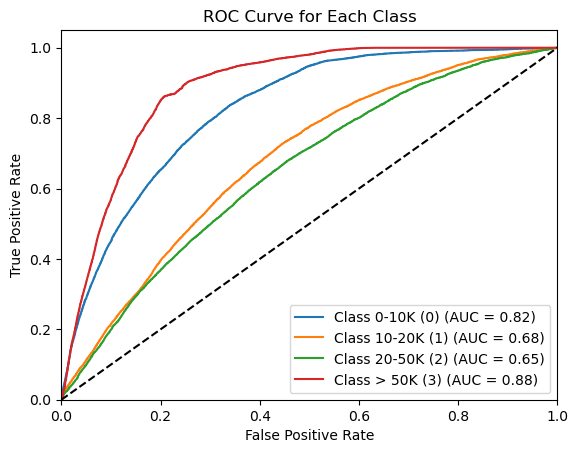

Ordinal Random Forest Model with Over-Sampling
                  precision    recall  f1-score   support

 Class 0-10K (0)       0.69      0.64      0.66     11879
Class 10-20K (1)       0.56      0.57      0.56     11879
Class 20-50K (2)       0.63      0.53      0.58     11879
 Class > 50K (3)       0.79      0.96      0.87     11879

        accuracy                           0.67     47516
       macro avg       0.67      0.67      0.67     47516
    weighted avg       0.67      0.67      0.67     47516

ROC-AUC Score: 0.8872884002891509


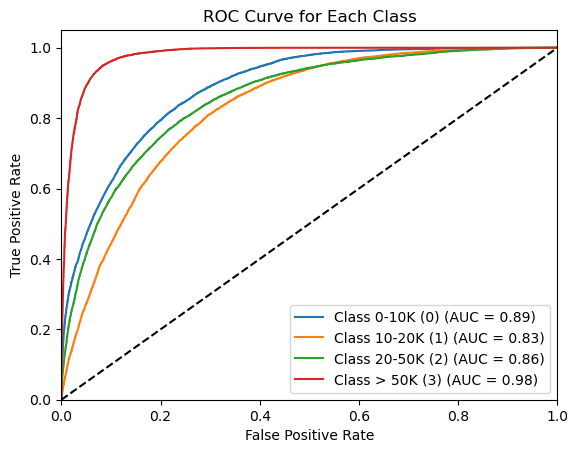

Ordinal Gradient Boosting Model with Over-Sampling
                  precision    recall  f1-score   support

 Class 0-10K (0)       0.63      0.62      0.62     11879
Class 10-20K (1)       0.53      0.54      0.53     11879
Class 20-50K (2)       0.53      0.48      0.51     11879
 Class > 50K (3)       0.79      0.86      0.82     11879

        accuracy                           0.62     47516
       macro avg       0.62      0.62      0.62     47516
    weighted avg       0.62      0.62      0.62     47516

ROC-AUC Score: 0.8547963004079897


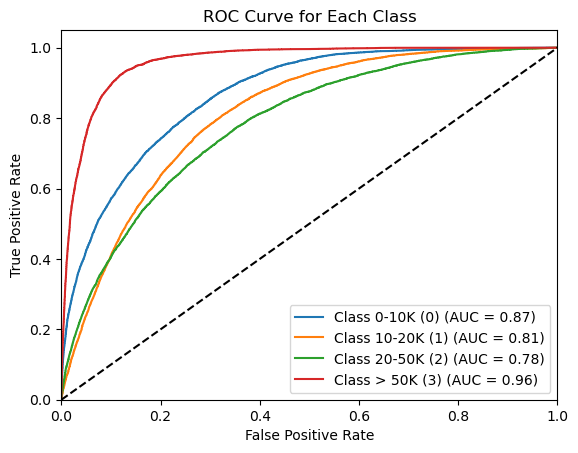

Ordinal LightGBM Model with Over-Sampling
                  precision    recall  f1-score   support

 Class 0-10K (0)       0.71      0.67      0.69     11879
Class 10-20K (1)       0.58      0.61      0.60     11879
Class 20-50K (2)       0.68      0.62      0.65     11879
 Class > 50K (3)       0.89      0.97      0.92     11879

        accuracy                           0.72     47516
       macro avg       0.71      0.72      0.71     47516
    weighted avg       0.71      0.72      0.71     47516

ROC-AUC Score: 0.9068586823181771


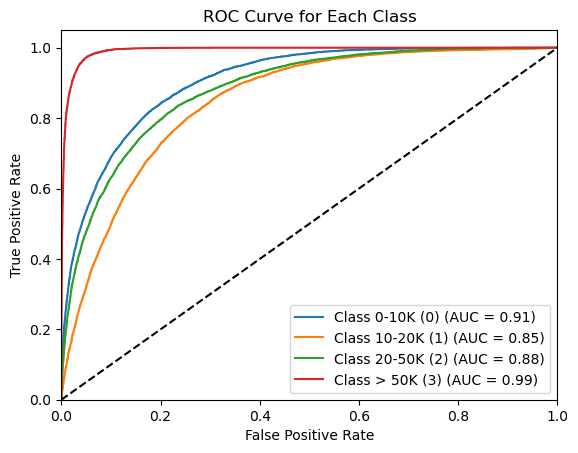

In [9]:
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
import numpy as np

# Compute the new feature: building_square_footage
train_df['builtup_area'] = pd.to_numeric(train_df['building_area'], errors='coerce')
train_df['building_height'] = pd.to_numeric(train_df['building_height'], errors='coerce')

# Compute the new feature: building_square_footage
train_df['building_square_footage'] = train_df['building_area'] * (train_df['building_height'] / 2.5)

# Drop 'sl_no' and 'name' columns from segmentation results
segmentation_columns = [col for col in feature_df.columns if col not in ['sl_no', 'name']]

# One-Hot Encode 'dma' feature
encoder = OneHotEncoder(drop='first', sparse_output=False)
dma_encoded = encoder.fit_transform(train_df[['dma']])

# Create pipelines for population, nightlight, and building_square_footage transformations
pipeline_population = Pipeline([
    ('imputer', SimpleImputer(strategy='median')),  # Impute missing values with the median
    ('scaler', StandardScaler())  # Standardize the data
])

pipeline_nightlight = Pipeline([
    ('imputer', SimpleImputer(strategy='median')),  # Impute missing values with the median
    ('scaler', StandardScaler())  # Standardize the data
])

pipeline_square_footage = Pipeline([
    ('imputer', SimpleImputer(strategy='median')),  # Impute missing values with the median
    ('scaler', StandardScaler())  # Standardize the data
])

# Apply transformations
population_scaled = pipeline_population.fit_transform(train_df[['population']])
nightlight_scaled = pipeline_nightlight.fit_transform(train_df[['nightlight']])
square_footage_scaled = pipeline_square_footage.fit_transform(train_df[['building_square_footage']])

# Reset the index of train_df to ensure alignment
train_df = train_df.reset_index(drop=True)
test_df = test_df.reset_index(drop=True)

# Filter the DataFrame to include segmentation columns
filtered_df = train_df[segmentation_columns]

# Ensure all data in `filtered_df` is numeric and handle missing values
filtered_df = filtered_df.apply(pd.to_numeric, errors='coerce')
imputer = SimpleImputer(strategy='median')  # Impute missing values with the median
filtered_df = pd.DataFrame(imputer.fit_transform(filtered_df), columns=segmentation_columns)

# Combine all features: segmentation results, dma, population, nightlight, and building_square_footage
features_combined = np.hstack((
    filtered_df.values,
    dma_encoded,
    population_scaled,
    nightlight_scaled,
    square_footage_scaled
))

# Apply SMOTE to balance the training dataset
smote = SMOTE(random_state=123)
X_train_balanced, y_train_balanced = smote.fit_resample(features_combined, train_labels)

print(f"Original training set size: {features_combined.shape}, {train_labels.shape}")
print(f"Balanced training set size: {X_train_balanced.shape}, {y_train_balanced.shape}")

# Train and evaluate the ordinal logistic regression model
print("Ordinal Logistic Regression Model with Over-Sampling")
ordinal_logistic_model = OrdinalClassifier(clf=LogisticRegression(max_iter=1000, multi_class='ovr', solver='lbfgs'))
cross_val_evaluate_model(ordinal_logistic_model, X_train_balanced, y_train_balanced, cv=5, class_labels=class_labels)

# Train and evaluate the ordinal random forest model
print("Ordinal Random Forest Model with Over-Sampling")
ordinal_rf_model = OrdinalClassifier(clf=RandomForestClassifier(n_estimators=100, max_depth=10, random_state=123))
cross_val_evaluate_model(ordinal_rf_model, X_train_balanced, y_train_balanced, cv=5, class_labels=class_labels)

# Train and evaluate the ordinal gradient boost model
print("Ordinal Gradient Boosting Model with Over-Sampling")
ordinal_gb_model = OrdinalClassifier(clf=GradientBoostingClassifier(n_estimators=100, learning_rate=0.1, random_state=123))
cross_val_evaluate_model(ordinal_gb_model, X_train_balanced, y_train_balanced, cv=5, class_labels=class_labels)

# Train and evaluate the ordinal LightGBM model
print("Ordinal LightGBM Model with Over-Sampling")
ordinal_lgb_model = OrdinalClassifier(clf=LGBMClassifier(objective='binary', max_depth=10, 
                                                         random_state=123, learning_rate=0.1, verbosity=-1, n_jobs=-1))
cross_val_evaluate_model(ordinal_lgb_model, X_train_balanced, y_train_balanced, cv=5, class_labels=class_labels)


### Hyperparametric Tuning

Fitting 5 folds for each of 128 candidates, totalling 640 fits
Best parameters: {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.1, 'clf__max_depth': 15, 'clf__min_child_samples': 10, 'clf__n_estimators': 150, 'clf__num_leaves': 40, 'clf__subsample': 0.8}
Best accuracy score: 0.7491180350277478
                  precision    recall  f1-score   support

 Class 0-10K (0)       0.75      0.70      0.72     11879
Class 10-20K (1)       0.60      0.64      0.62     11879
Class 20-50K (2)       0.74      0.70      0.72     11879
 Class > 50K (3)       0.94      0.98      0.96     11879

        accuracy                           0.76     47516
       macro avg       0.76      0.76      0.76     47516
    weighted avg       0.76      0.76      0.76     47516

ROC-AUC Score: 0.9241282546154688


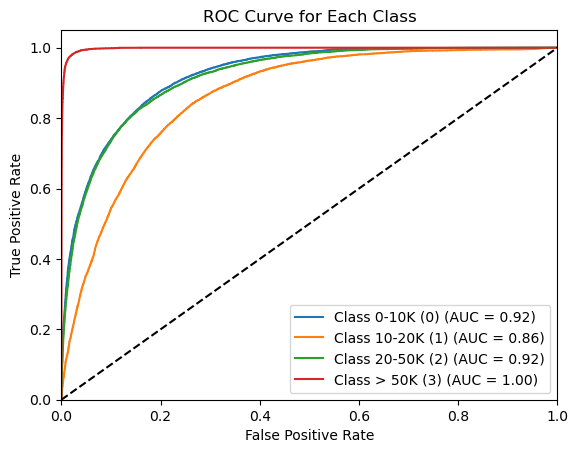

In [10]:
from sklearn.model_selection import GridSearchCV

# Define the parameter grid for LightGBM
param_grid = {
    'clf__n_estimators': [100, 150],
    'clf__max_depth': [10, 15],
    'clf__learning_rate': [0.05, 0.1],
    'clf__num_leaves': [20, 40], 
    'clf__min_child_samples': [10, 20],
    'clf__subsample': [0.8, 1.0],
    'clf__colsample_bytree': [0.8, 1.0],
}

# Initialize the OrdinalClassifier with a base LightGBM model
ordinal_lgb = OrdinalClassifier(
    clf=LGBMClassifier(
        objective='binary',  # Will be used in binary splits inside the wrapper
        random_state=123,
        verbosity=-1,
        n_jobs=-1
    )
)

# Create the GridSearchCV
grid_search = GridSearchCV(
    estimator=ordinal_lgb,
    param_grid=param_grid,
    scoring={
        'accuracy': 'accuracy',
        'roc_auc': 'roc_auc_ovr'
    },
    refit='accuracy',  # Refit using the best accuracy model
    cv=5,
    n_jobs=-1,
    verbose=2
)

# Fit to training data
grid_search.fit(X_train_balanced, y_train_balanced)

# Print best parameters and score
print("Best parameters:", grid_search.best_params_)
print("Best accuracy score:", grid_search.best_score_)

# Retrieve best estimator and evaluate
best_ordinal_lgb = grid_search.best_estimator_
cross_val_evaluate_model(best_ordinal_lgb, X_train_balanced, y_train_balanced, cv=5, class_labels=class_labels)


### Feature Importance

In [11]:
def extract_feature_importance_from_ordinal_model(ordinal_model, feature_names):
    """
    Extract and normalize feature importance from the sub-models in an OrdinalClassifier.
    This works for models that expose `feature_importances_` (e.g., Random Forest, Gradient Boosting, LightGBM).
    """
    all_importances = []

    # Iterate through each sub-model in the ordinal classifier
    for i, clf in ordinal_model.clfs.items():
        if hasattr(clf, "feature_importances_"):  # Ensure the model has feature_importances_
            importances = clf.feature_importances_

            # Normalize LightGBM feature importance if applicable
            if isinstance(clf, LGBMClassifier):
                total_importance = np.sum(importances)
                if total_importance > 0:
                    importances = importances / total_importance

            all_importances.append(importances)

    # Convert the list of importances to a numpy array
    all_importances = np.array(all_importances)

    # Aggregate the importances (e.g., by taking the mean across sub-models)
    mean_importance = np.mean(all_importances, axis=0)

    # Create a DataFrame for better visualization
    feature_importance_df = pd.DataFrame({
        "Feature": feature_names,
        "Importance": mean_importance
    })

    # Sort by absolute value of importance
    feature_importance_df["AbsImportance"] = feature_importance_df["Importance"].abs()
    feature_importance_df = feature_importance_df.sort_values(by="AbsImportance", ascending=False)

    return feature_importance_df


In [21]:
# Generate the full list of feature names
full_feature_names = (
    filtered_df.columns.tolist()
    + encoder.get_feature_names_out().tolist()
    + ["population_scaled", "nightlight_scaled", "square_footage_scaled"]
)

# Train Ordinal Random Forest Model
print("Best Performance Ordinal LightGB Model")

# Extract feature importance
lgb_feature_importance_df = extract_feature_importance_from_ordinal_model(
    best_ordinal_lgb, feature_names=full_feature_names
)

print("Top 20 Important Features for LightGB Model:")
print(lgb_feature_importance_df.head(20))


Best Performance Ordinal LightGB Model
Top 20 Important Features for LightGB Model:
                  Feature  Importance  AbsImportance
69      nightlight_scaled    0.088775       0.088775
68      population_scaled    0.081937       0.081937
70  square_footage_scaled    0.074986       0.074986
2                     sky    0.038632       0.038632
1                building    0.037892       0.037892
4                    tree    0.032821       0.032821
13                  earth    0.030541       0.030541
0                    wall    0.029459       0.029459
11               sidewalk    0.027692       0.027692
17                  plant    0.027464       0.027464
41              signboard    0.026895       0.026895
6                    road    0.025356       0.025356
3                   floor    0.023932       0.023932
12                 person    0.023134       0.023134
31                  fence    0.023020       0.023020
14                   door    0.022678       0.022678
37             

C:\Users\doris\AppData\Local\Temp\ipykernel_32072\1226174086.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x='Importance', y='Feature', data=top_features,


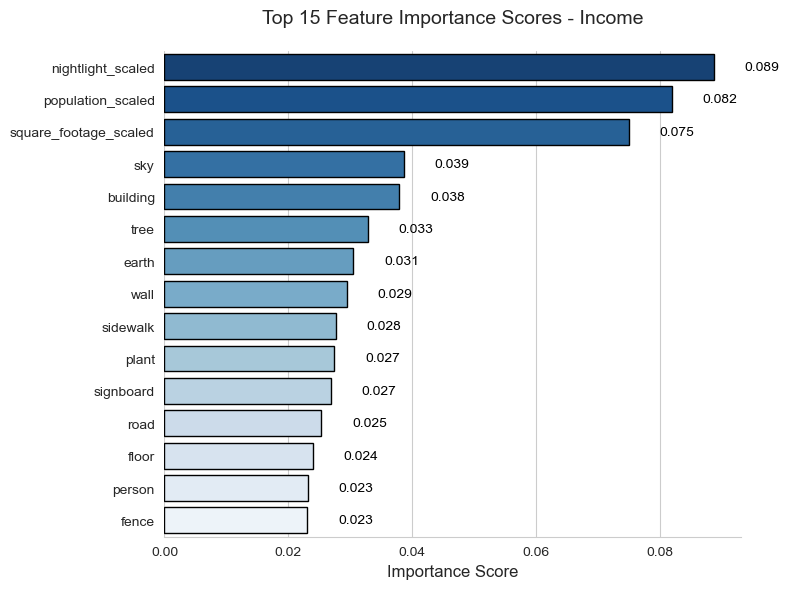

In [20]:
import seaborn as sns

# Set style
sns.set_style("whitegrid")
plt.figure(figsize=(8, 6))

# Get top 15 features
top_features = lgb_feature_importance_df.nlargest(15, 'Importance')

# Create barplot
ax = sns.barplot(x='Importance', y='Feature', data=top_features, 
                palette="Blues_r", edgecolor='black')

# Add data labels
for i, (importance, feature) in enumerate(zip(top_features['Importance'], top_features['Feature'])):
    ax.text(importance + 0.005, i, f"{importance:.3f}", 
           va='center', fontsize=10, color='black')

# Customize appearance
plt.title('Top 15 Feature Importance Scores - Income', fontsize=14, pad=20)
plt.xlabel('Importance Score', fontsize=12)
plt.ylabel('')
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
sns.despine(left=True)

# Adjust layout
plt.tight_layout()
plt.show()

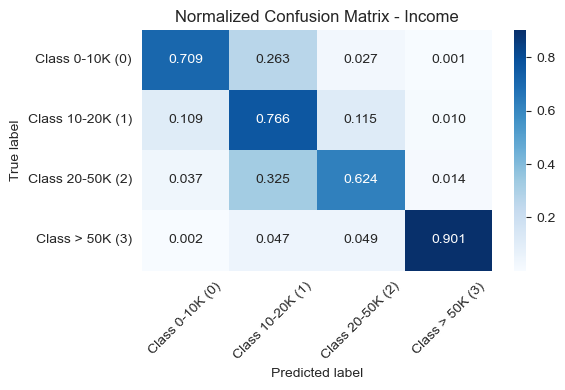

In [28]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score

# Use your best model
best_ordinal_lgb = grid_search.best_estimator_

# Predict on the original (unbalanced) training data
X_train, y_train = features_combined, train_labels
y_train_pred = best_ordinal_lgb.predict(X_train)

# Compute normalized confusion matrix
cm = confusion_matrix(y_train, y_train_pred, normalize='true')

# Plot using seaborn heatmap with color bar of same height
fig, ax = plt.subplots(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt=".3f", cmap='Blues', xticklabels=class_labels, yticklabels=class_labels,
            cbar_kws={"shrink": 1.0}, ax=ax)

# Keep x and y tick labels horizontal
ax.set_xticklabels(class_labels, rotation=45)
ax.set_yticklabels(class_labels, rotation=0)

plt.title("Normalized Confusion Matrix - Income")
plt.xlabel("Predicted label")
plt.ylabel("True label")
plt.tight_layout()
plt.show()


In [15]:
# Overall accuracy
overall_accuracy = accuracy_score(y_train, y_train_orig_pred)
print(f"Overall Accuracy: {overall_accuracy:.4f}")

# Per-class accuracy: diagonal / row sum
class_accuracies = np.diag(cm) / cm.sum(axis=1)
for i, label in enumerate(class_labels):
    print(f"Accuracy for {label}: {class_accuracies[i]:.4f}")

Overall Accuracy: 0.7282
Accuracy for Class 0-10K (0): 0.7090
Accuracy for Class 10-20K (1): 0.7661
Accuracy for Class 20-50K (2): 0.6241
Accuracy for Class > 50K (3): 0.9013


In [ ]:
# Create DataFrame with original training data and predictions
full_train_df = train_df.copy()  # original dataframe before SMOTE
full_train_df['True'] = y_train
full_train_df['Predicted'] = y_train_orig_pred

# Filter misclassified samples
misclassified = full_train_df[full_train_df['True'] != full_train_df['Predicted']]

# Report misclassification summary
total = len(full_train_df)
mis = len(misclassified)
print(f"Total misclassified samples: {mis}/{total} ({mis/total:.1%})")

# Optional: focus on important features to inspect
features_to_analyze = [
    'nightlight', 'population', 'building_square_footage',
    'sky', 'building', 'tree', 'earth', 'wall', 'sidewalk',
    'plant', 'signboard', 'road', 'floor', 'person', 'fence'
]

Total misclassified samples: 5898/21702 (27.2%)


In [18]:
misclassified[['sl_no', 'True', 'Predicted'] + features_to_analyze].head(16)

,sl_no,True,Predicted,nightlight,population,building_square_footage,sky,building,tree,earth,wall,sidewalk,plant,signboard,road,floor,person,fence
5,94643,1,0,76.722618,19.277744,485.741739,0.064946,0.469183,0.045279,0.001154,0.091987,0.055300,0.000000,0.003646,0.159067,0.000000,0.001083,0.000162
9,31614,1,2,33.756550,12.257151,61.747318,0.119846,0.558329,0.003417,0.035025,0.000000,0.047688,0.123463,0.000000,0.070996,0.003167,0.000000,0.000000
10,7019,1,2,31.587027,80.731148,528.125812,0.050067,0.673946,0.000000,0.089154,0.009779,0.047804,0.013804,0.000000,0.009121,0.002421,0.000000,0.088133
16,99631,0,1,26.919165,74.967255,6.141251,0.211562,0.099629,0.250987,0.281121,0.000000,0.000000,0.147150,0.000000,0.000000,0.000000,0.000000,0.000000
28,176869,0,1,40.938469,13.556190,163.935483,0.083983,0.154862,0.032333,0.107713,0.044612,0.000000,0.573992,0.000000,0.000000,0.000000,0.000000,0.000000
31,183401,1,0,70.307976,15.819687,112.797297,0.132775,0.850554,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.013942,0.000000
35,199157,1,0,25.177479,119.399887,NaN,0.402929,0.162092,0.012108,0.000000,0.050992,0.022838,0.000000,0.000000,0.000000,0.001617,0.000000,0.000000
36,19440,0,1,31.587027,93.561882,39.455029,0.054117,0.613088,0.000000,0.059721,0.139608,0.025087,0.000000,0.000000,0.024271,0.021079,0.000000,0.000000
38,189282,2,1,38.307434,143.713745,100.620551,0.007329,0.797887,0.002900,0.005625,0.001071,0.021704,0.000046,0.080888,0.000000,0.000000,0.000000,0.000000
40,175506,1,0,52.205345,13.433596,162.752264,0.036500,0.809358,0.000000,0.063275,0.000287,0.009129,0.000000,0.000000,0.000033,0.007633,0.005788,0.000000


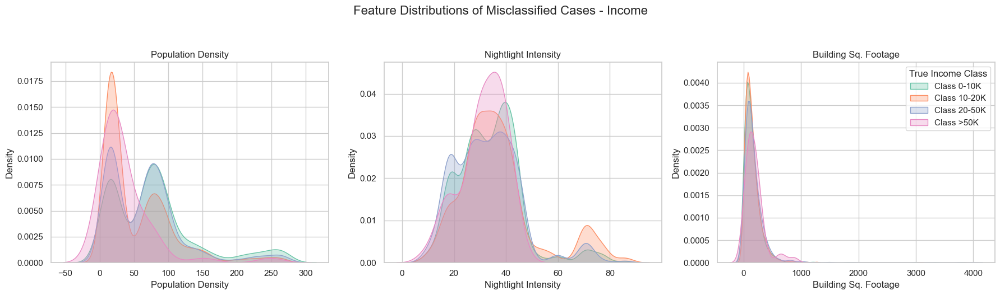

In [45]:
# Misclassified cases by key features
# Step 1: Create a copy and map labels
label_map = {
    0: 'Class 0-10K',
    1: 'Class 10-20K',
    2: 'Class 20-50K',
    3: 'Class >50K'
}

misclassified = misclassified.copy()
misclassified['True_Label'] = misclassified['True'].map(label_map)

# Step 2: Plot settings
features = ['population', 'nightlight', 'building_square_footage']
titles = ['Population Density', 'Nightlight Intensity', 'Building Sq. Footage']
palette = sns.color_palette('Set2', n_colors=4)
hue_order = ['Class 0-10K', 'Class 10-20K', 'Class 20-50K', 'Class >50K']

fig, axes = plt.subplots(1, 3, figsize=(18, 5))
sns.set(style="whitegrid")

for i, (feat, title) in enumerate(zip(features, titles)):
    ax = axes[i]
    for hue_val, color in zip(hue_order, palette):
        subset = misclassified[misclassified['True_Label'] == hue_val]
        sns.kdeplot(
            data=subset,
            x=feat,
            fill=True,
            label=hue_val if i == 2 else None,  # Show label ONLY on third plot
            common_norm=False,
            alpha=0.3,
            color=color,
            ax=ax
        )
    ax.set_title(title)
    ax.set_xlabel(title)
    ax.set_ylabel('Density')
    if i == 2:
        ax.legend(title='True Income Class')
    else:
        legend = ax.get_legend()
        if legend is not None:
            legend.remove()

plt.suptitle('Feature Distributions of Misclassified Cases - Income', fontsize=16, y=1.05)
plt.tight_layout()
plt.show()



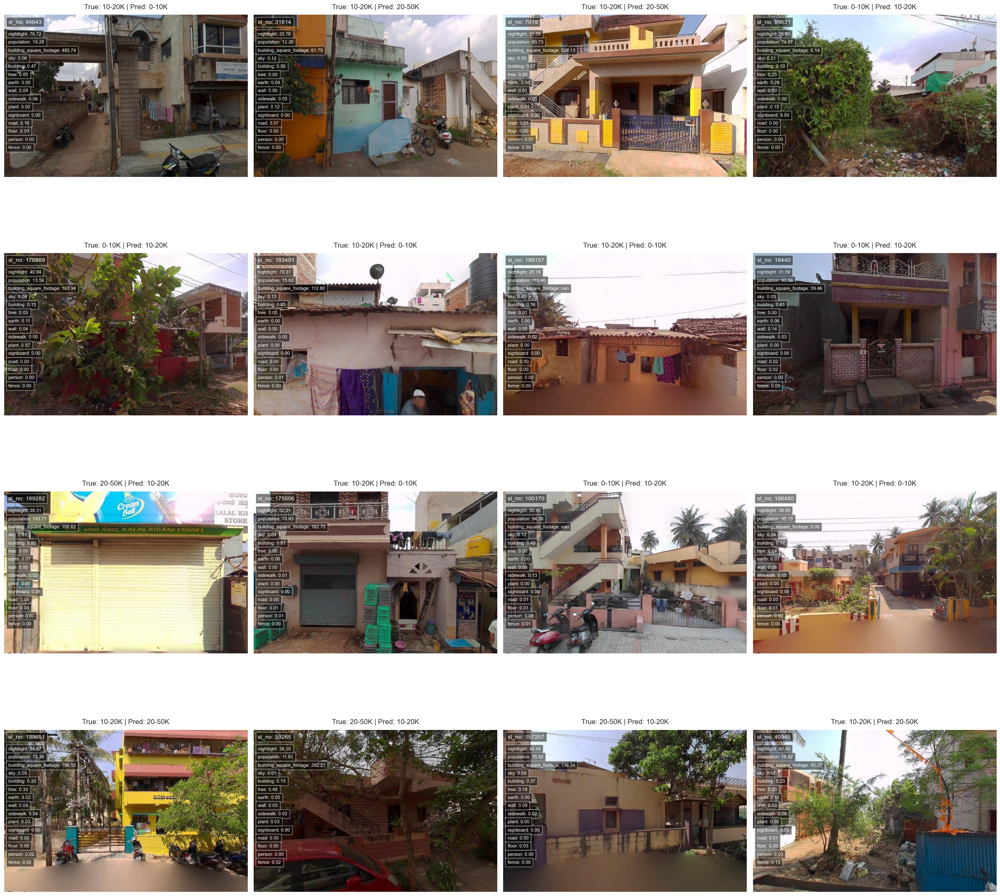

In [ ]:
from PIL import Image

# Configuration
image_folder_path = "../data/raw/Hubballi_Original"
label_mapping = {'0-10K': 0, '10-20K': 1, '20-50K': 2, '> 50K': 3}
reverse_label_mapping = {v: k for k, v in label_mapping.items()}
np.random.seed(42)

# Get top 15 important features
top_15_features = features_to_analyze

# Randomly select 16 misclassified cases (4x4 grid)
sample_misclassified = misclassified.head(16)

# Create figure with 4 columns and 4 rows
fig, axes = plt.subplots(4, 4, figsize=(24, 24))
axes = axes.ravel()

for idx, (_, row) in enumerate(sample_misclassified.iterrows()):
    ax = axes[idx]
    
    # Load and display image
    image_path = os.path.join(image_folder_path, row['name'])
    try:
        img = Image.open(image_path)
        ax.imshow(img)
    except Exception as e:
        print(f"Error loading image {image_path}: {e}")
        ax.axis('off')
        continue
    
    # Set title with true/predicted labels in your style
    true_label = reverse_label_mapping[row['True']]
    pred_label = reverse_label_mapping[row['Predicted']]
    ax.set_title(f"True: {true_label} | Pred: {pred_label}", fontsize=12, pad=10)
    
    # Add sl_no in top-left corner 
    ax.text(10, 20, f"sl_no: {row['sl_no']}", color='white', fontsize=10,
           bbox=dict(facecolor='black', alpha=0.5))
    
    # Add feature percentages in top-left with 2 decimal places
    for j, feature in enumerate(top_15_features):
        if feature in row:
            # Format the value to show 2 decimal places
            formatted_value = f"{float(row[feature]):.2f}"
            ax.text(10, 50 + j*20, f"{feature}: {formatted_value}", 
                   color='white', fontsize=8,
                   bbox=dict(facecolor='black', alpha=0.5))
    
    ax.axis('off')

# Hide any unused axes
for idx in range(len(sample_misclassified), len(axes)):
    axes[idx].axis('off')

plt.tight_layout()
plt.show()

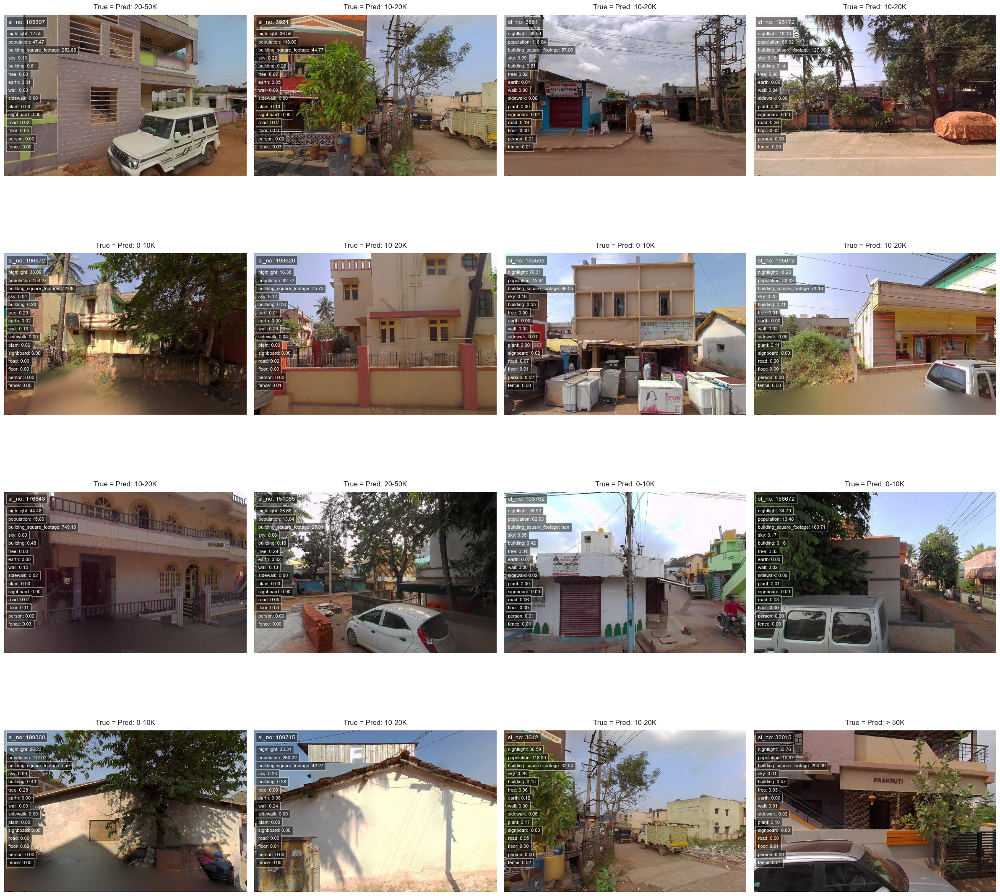

In [51]:
# Filter correctly classified samples
correct_classified = full_train_df[full_train_df['True'] == full_train_df['Predicted']]

# Randomly select 16 correctly classified cases
sample_correct = correct_classified.sample(n=16, random_state=123)

# Create figure with 4 columns and 4 rows
fig, axes = plt.subplots(4, 4, figsize=(24, 24))
axes = axes.ravel()

for idx, (_, row) in enumerate(sample_correct.iterrows()):
    ax = axes[idx]
    
    # Load and display image
    image_path = os.path.join(image_folder_path, row['name'])
    try:
        img = Image.open(image_path)
        ax.imshow(img)
    except Exception as e:
        print(f"Error loading image {image_path}: {e}")
        ax.axis('off')
        continue
    
    # Set title
    label = reverse_label_mapping[row['True']]
    ax.set_title(f"True = Pred: {label}", fontsize=12, pad=10)
    
    # Add sl_no in top-left corner 
    ax.text(10, 20, f"sl_no: {row['sl_no']}", color='white', fontsize=10,
           bbox=dict(facecolor='black', alpha=0.5))
    
    # Add feature percentages
    for j, feature in enumerate(top_15_features):
        if feature in row:
            formatted_value = f"{float(row[feature]):.2f}"
            ax.text(10, 50 + j*20, f"{feature}: {formatted_value}", 
                   color='white', fontsize=8,
                   bbox=dict(facecolor='black', alpha=0.5))
    
    ax.axis('off')

# Hide any unused axes
for idx in range(len(sample_correct), len(axes)):
    axes[idx].axis('off')

plt.tight_layout()
plt.show()
